<a href="https://colab.research.google.com/github/JeroCR05/ProyectoPapai/blob/main/ProyectoFinal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [55]:
# Cargamos las librerias
import pandas as pd
import numpy as np
import geopandas as gpd
import rasterio
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import threading
import os
import gradio as gr
import folium

from folium.plugins import MarkerCluster
from sklearn.model_selection import cross_val_score
from shapely.geometry import Point
from pyngrok import ngrok
from colorama import Fore, Style
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [54]:
%load_ext rpy2.ipython
%pip install pyngrok
!pip install folium
%pip install colorama
%pip install rasterio
!pip install gradio


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [3]:
# Cargar el dataset
df = pd.read_csv("/content/Cat_logo_Nacional_de_Estaciones_del_IDEAM_20250724.csv.csv")

# Ver las primeras filas
df.head()

,Codigo,Nombre,Categoria,Tecnologia,Estado,Departamento,Municipio,Ubicación,Altitud,Fecha_instalacion,Fecha_suspension,Area Operativa,Corriente,Area Hidrografica,Zona Hidrografica,Subzona hidrografica,Entidad
0,52057100,RUMICHACA - AUT [52057100],Limnigráfica,Automática con Telemetría,Activa,Nariño,Ipiales,"(0.81378611, -77.66197778)",2582,2016-11-15,NaN,Area Operativa 07 - Nariño-Putumayo,Guaitara,Pacifico,Patía,Río Guáitara,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...
1,52055170,LA JOSEFINA - AUT [52055170],Climática Principal,Automática con Telemetría,Activa,Nariño,Contadero,"(0.93030556, -77.49119444)",2450,2005-12-10,NaN,Area Operativa 07 - Nariño-Putumayo,Guaitara,Pacifico,Patía,Río Guáitara,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...
2,52055220,EL PARAISO - AUT [52055220],Climática Principal,Automática con Telemetría,Activa,Nariño,Túquerres,"(1.07061111, -77.63688889)",3120,2004-03-01,NaN,Area Operativa 07 - Nariño-Putumayo,Guaitara,Pacifico,Patía,Río Guáitara,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...
3,44015070,EL PEPINO - AUT [44015070],Climática Principal,Automática con Telemetría,Activa,Putumayo,Mocoa,"(1.08288889, -76.66711111)",760,2005-11-11,NaN,Area Operativa 07 - Nariño-Putumayo,Guaitara,Amazonas,Caquetá,Alto Caqueta,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...
4,48015040,PUERTO NARINO - AUT [48015040],Climática Principal,Automática con Telemetría,Activa,Amazonas,Puerto Nariño,"(-3.78030556, -70.36263889)",158,2005-07-19,NaN,Area Operativa 11 - Cundinamarca-Amazonas-San ...,Amazonas,Amazonas,Amazonas - Directos,Directos Río Amazonas (mi),INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...


In [4]:
# Ver nombres de columnas
print(df.columns)

# Opcional: eliminar columnas que no aportan al análisis
columnas_a_eliminar = ['Codigo', 'Nombre', 'Fecha_suspension', 'Estado', 'Entidad']
df = df.drop(columns=[col for col in columnas_a_eliminar if col in df.columns])


Index(['Codigo', 'Nombre', 'Categoria', 'Tecnologia', 'Estado', 'Departamento',
       'Municipio', 'Ubicación', 'Altitud', 'Fecha_instalacion',
       'Fecha_suspension', 'Area Operativa', 'Corriente', 'Area Hidrografica',
       'Zona Hidrografica', 'Subzona hidrografica', 'Entidad'],
      dtype='object')


In [5]:
# Mostrar cuántos valores faltantes hay por columna
print("valores faltantes en las columnas:")
print(df[['Altitud', 'Ubicación']].isnull().sum())

valores faltantes en las columnas:
Altitud      0
Ubicación    0
dtype: int64


In [6]:
df = df.rename(columns={
    'ALTITUD': 'Altitud',
    'LATITUD': 'Latitud',
    'LONGITUD': 'Longitud',
    'TEMPERATURA': 'Temperatura',
    'HUMEDAD_RELATIVA': 'Humedad',
    'PRECIPITACION_TOTAL': 'Precipitacion',

})


In [7]:
#clasificar si es apto para la papa
def clasificar_apto_papa(row):
    if 2000 <= row['Altitud'] <= 3200 and 5.5 <= row['pH_suelo'] <= 7.0:
        return 1
    return 0

if 'pH_suelo' in df.columns:
    df['Papa_apto'] = df.apply(clasificar_apto_papa, axis=1)
else:
    print("⚠️ No se encontró la columna 'pH_suelo'. Verifica que ya hayas cargado esos datos.")



⚠️ No se encontró la columna 'pH_suelo'. Verifica que ya hayas cargado esos datos.


In [8]:
#para ver las ultimas filas del DataFrame
print(df.tail(3))

         Categoria                 Tecnologia Departamento    Municipio  \
8970  Limnimétrica  Automática con Telemetría     Putumayo  Villagarzón   
8971  Limnimétrica  Automática con Telemetría     Putumayo        Mocoa   
8972  Limnimétrica  Automática con Telemetría     Putumayo        Mocoa   

                       Ubicación  Altitud Fecha_instalacion  \
8970  (1.03964167, -76.61091944)      408        2020-02-25   
8971       (1.119225, -76.67045)      647        2020-02-25   
8972    (1.088775, -76.69261667)      868        2020-02-25   

                           Area Operativa Corriente Area Hidrografica  \
8970  Area Operativa 07 - Nariño-Putumayo     Mocoa          Amazonas   
8971  Area Operativa 07 - Nariño-Putumayo     Mocoa          Amazonas   
8972  Area Operativa 07 - Nariño-Putumayo     Mocoa          Amazonas   

     Zona Hidrografica Subzona hidrografica  
8970           Caquetá         Alto Caqueta  
8971           Caquetá         Alto Caqueta  
8972           

In [9]:
df.describe()

,Altitud
count,8973.000000
mean,1209.487797
std,1023.864901
min,0.000000
25%,190.000000
50%,1049.000000
75%,1960.000000
max,5072.000000


In [10]:
# Clasificar como apto solo por altitud
df['Papa_apto'] = ((df['Altitud'] >= 1800) & (df['Altitud'] <= 3400)).astype(int)

# Ver cuántos puntos aptos hay ahora
print(df['Papa_apto'].value_counts())

Papa_apto
0    6524
1    2449
Name: count, dtype: int64


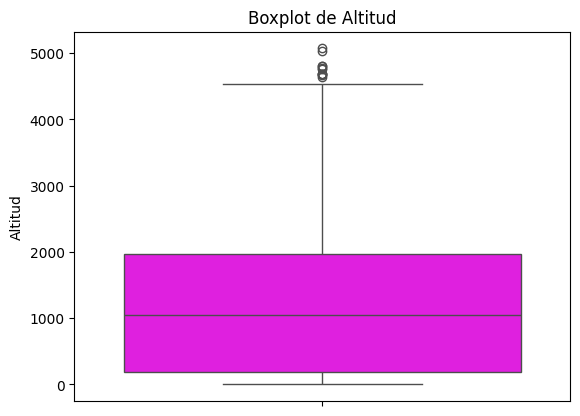

In [11]:
#Detectar outliers y ver la distribución (asimetría, mediana, rango) de una variable numérica.
sns.boxplot(data=df, y='Altitud', color='magenta')
plt.title("Boxplot de Altitud")
plt.show()

In [12]:
# Guardar en nuevo archivo limpio
df.to_csv("/content/dataset_limpio_para_modelo.csv", index=False)

print("✅ Dataset limpio y guardado como 'dataset_limpio_para_modelo.csv'")


✅ Dataset limpio y guardado como 'dataset_limpio_para_modelo.csv'


In [13]:
df = pd.read_csv("/content/Cat_logo_Nacional_de_Estaciones_del_IDEAM_20250724.csv.csv")

# Mostrar las primeras filas de la columna 'Ubicación' para diagnóstico
print("Primeras filas de la columna 'Ubicación':")
print(df['Ubicación'].head().to_markdown(numalign="left", stralign="left"))

# Extraer latitud y longitud desde la cadena de texto en 'Ubicación'
df['Latitud'] = df['Ubicación'].apply(lambda x: eval(x)[0] if pd.notnull(x) else None)
df['Longitud'] = df['Ubicación'].apply(lambda x: eval(x)[1] if pd.notnull(x) else None)


# Crear GeoDataFrame con puntos
geometry = [Point(xy) for xy in zip(df["Longitud"], df["Latitud"])]
gdf = gpd.GeoDataFrame(df, geometry=geometry, crs="EPSG:4326")  # CRS WGS84

# Abrir raster de pH
raster_path = "/content/dataset_solis_ph.tif"
raster = rasterio.open(raster_path)
# Extraer latitud y longitud desde la cadena de texto en 'Ubicación'
df['Latitud'] = df['Ubicación'].apply(lambda x: eval(x)[0] if pd.notnull(x) else None)
df['Longitud'] = df['Ubicación'].apply(lambda x: eval(x)[1] if pd.notnull(x) else None)


# Reproyectar puntos al CRS del raster
gdf = gdf.to_crs(raster.crs)

# Tomar coordenadas para muestreo
coords = [(geom.x, geom.y) for geom in gdf.geometry]

# Extraer valores del raster en esos puntos
ph_values = list(raster.sample(coords))
gdf["pH_suelo"] = [val[0] if val[0] is not None else np.nan for val in ph_values]

# Asignar el GeoDataFrame con la columna 'pH_suelo' de vuelta a df
df = gdf

# Verificar valores de pH
df['pH_suelo'].value_counts(dropna=False)
def estimar_ph_por_altitud(alt):
    if alt >= 3000:
        return 4.5
    elif alt >= 2000:
        return 5.0
    elif alt >= 1000:
        return 5.5
    else:
        return 6.0

df['pH_suelo'] = df['Altitud'].apply(estimar_ph_por_altitud)

df[["Latitud", "Longitud", "pH_suelo"]].head()

Primeras filas de la columna 'Ubicación':
|    | Ubicación                   |
|:---|:----------------------------|
| 0  | (0.81378611, -77.66197778)  |
| 1  | (0.93030556, -77.49119444)  |
| 2  | (1.07061111, -77.63688889)  |
| 3  | (1.08288889, -76.66711111)  |
| 4  | (-3.78030556, -70.36263889) |


,Latitud,Longitud,pH_suelo
0,0.813786,-77.661978,5.0
1,0.930306,-77.491194,5.0
2,1.070611,-77.636889,4.5
3,1.082889,-76.667111,6.0
4,-3.780306,-70.362639,6.0


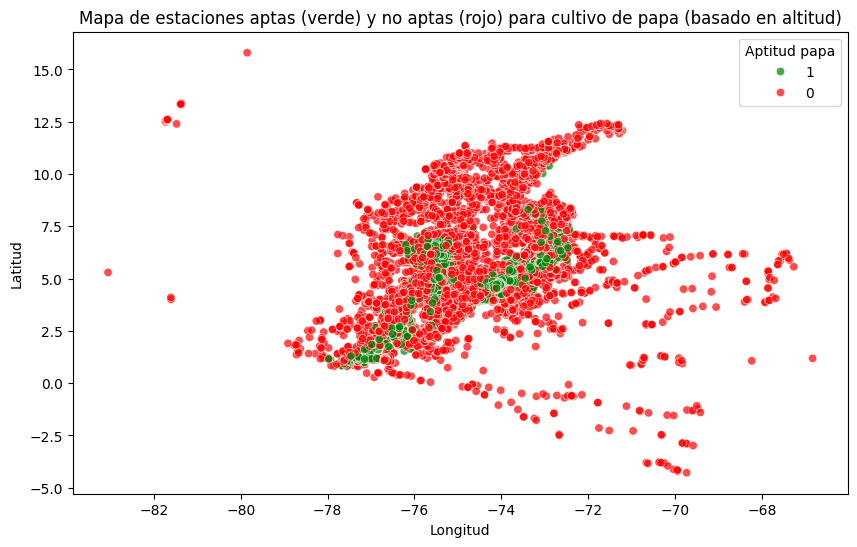

In [14]:
# Recreate 'Papa_apto' column based on criteria
def clasificar_apto_papa(row):
    if 1800 <= row['Altitud'] <= 3400 and 5.0 <= row['pH_suelo'] <= 7.5:
        return 1
    return 0

df['Papa_apto'] = df.apply(clasificar_apto_papa, axis=1)

# Convertir columna de aptitud a texto para usar
df['Papa_apto'] = df['Papa_apto'].astype(str)

# Crear gráfico de dispersión con colores según aptitud
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='Longitud', y='Latitud', hue='Papa_apto', palette={'1': 'green', '0': 'red'}, alpha=0.7)
# Personalizar títulos y etiquetas
plt.title("Mapa de estaciones aptas (verde) y no aptas (rojo) para cultivo de papa (basado en altitud)")
plt.xlabel("Longitud")
plt.ylabel("Latitud")
plt.legend(title="Aptitud papa")
plt.show()

# Este gráfico permite identificar zonas geográficas con mayor aptitud para el cultivo, basándose principalmente en criterios de altitud (aunque pueden incluirse otras variables).
# Podemos ver concentraciones verdes en ciertas zonas, lo que indica que esas regiones cumplen mejor con las condiciones requeridas para el cultivo de papa.


# Ejes:

* X (Longitud) → Posición geográfica Este-Oeste.

* Y *(Latitud) → Posición geográfica Norte-Sur.

# Colores:

* Verde → Estaciones aptas para cultivo de papa (clasificadas como “1”).

* Rojo → Estaciones no aptas para cultivo de papa (clasificadas como “0”).

* Tono semitransparente (alpha=0.7) para mejorar la visualización en áreas con alta densidad de puntos

In [15]:
#clasificar papa apto
def clasificar_apto_papa(row):
    if 1800 <= row['Altitud'] <= 3400 and 5.0 <= row['pH_suelo'] <= 7.5:
        return 1
    return 0

df['Papa_apto'] = df.apply(clasificar_apto_papa, axis=1)

print(df['Papa_apto'].value_counts(normalize=True) * 100)

Papa_apto
0    75.849772
1    24.150228
Name: proportion, dtype: float64


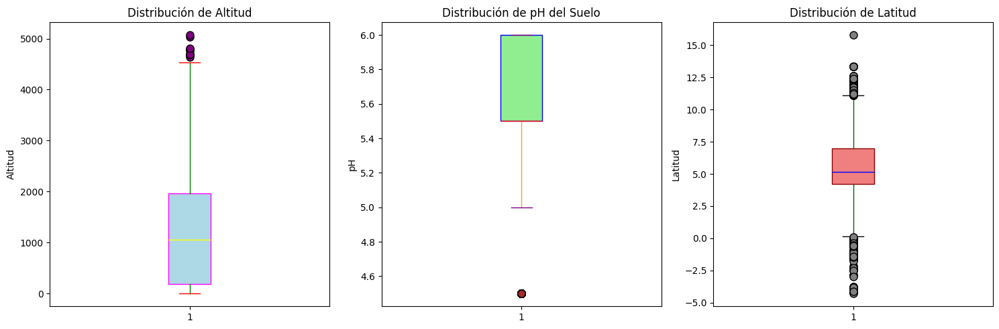

In [16]:
# Crear subgráficos para tres boxplots (Altitud, pH del suelo, Latitud)
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Boxplot para Altitud: muestra dispersión, mediana y outliers
axes[0].boxplot(df['Altitud'], patch_artist=True,
                boxprops=dict(facecolor='lightblue', color='magenta'),
                whiskerprops=dict(color='green'),
                capprops=dict(color='red'),
                medianprops=dict(color='yellow'),
                flierprops=dict(marker='o', markerfacecolor='purple', markersize=8))
axes[0].set_title("Distribución de Altitud")
axes[0].set_ylabel("Altitud")

# Boxplot para pH del suelo
# Indica tendencia central y dispersión del pH
if 'pH_suelo' in df.columns:
    axes[1].boxplot(df['pH_suelo'].dropna(), patch_artist=True,
                    boxprops=dict(facecolor='lightgreen', color='blue'),
                    whiskerprops=dict(color='orange'),
                    capprops=dict(color='purple'),
                    medianprops=dict(color='red'),
                    flierprops=dict(marker='o', markerfacecolor='brown', markersize=8))
    axes[1].set_title("Distribución de pH del Suelo")
    axes[1].set_ylabel("pH")

# Boxplot para Latitud (si existe en el DataFrame)
# Refleja variabilidad y posibles valores atípicos de latitud
if 'Latitud' in df.columns:
    axes[2].boxplot(df['Latitud'].dropna(), patch_artist=True,
                    boxprops=dict(facecolor='lightcoral', color='darkred'),
                    whiskerprops=dict(color='darkgreen'),
                    capprops=dict(color='black'),
                    medianprops=dict(color='blue'),
                    flierprops=dict(marker='o', markerfacecolor='gray', markersize=8))
    axes[2].set_title("Distribución de Latitud")
    axes[2].set_ylabel("Latitud")

plt.tight_layout()
plt.show()

# Este conjunto de gráficos muestra la distribución de tres variables clave: altitud, pH del suelo y latitud. Cada gráfico es un boxplot que resume visualmente los valores mínimos, máximos, la mediana y la dispersión de los datos, además de marcar posibles valores atípicos (outliers) como puntos individuales.

#  -En el boxplot de altitud, se observa la variabilidad de las alturas donde se tomaron los datos.

# -El boxplot de pH del suelo revela la tendencia central y la dispersión de los niveles de acidez/alcalinidad.

# -El boxplot de latitud indica la distribución de la ubicación geográfica de los registros.


In [17]:
df.to_csv("/content/dataset_con_ph_y_apto.csv", index=False)
print("✅ Dataset final guardado con pH y etiqueta 'Papa_apto'")


✅ Dataset final guardado con pH y etiqueta 'Papa_apto'


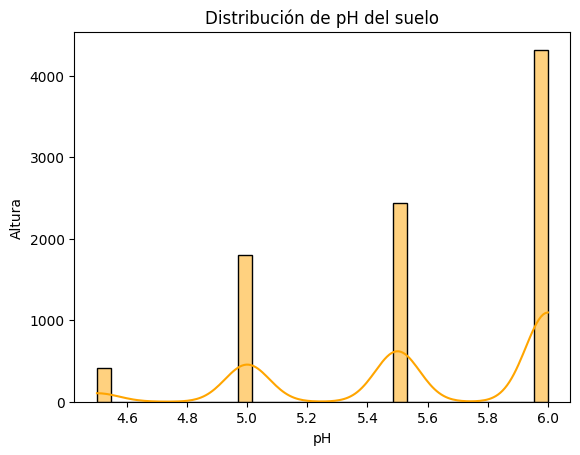

In [18]:
#Ver cómo se distribuyen los valores de una variable: ¿normal? ¿sesgada? ¿multimodal?
sns.histplot(df['pH_suelo'], kde=True, color='orange')
plt.title("Distribución de pH del suelo")
plt.xlabel("pH")
plt.ylabel("Altura")
plt.show()

# ***Este gráfico muestra la distribución del pH del suelo en el conjunto de datos. En el eje horizontal se representan los valores de pH, y en el vertical la frecuencia con la que aparecen esos valores. La curva  (KDE) permite identificar tendencias y concentraciones, evidenciando los rangos de pH más comunes.***

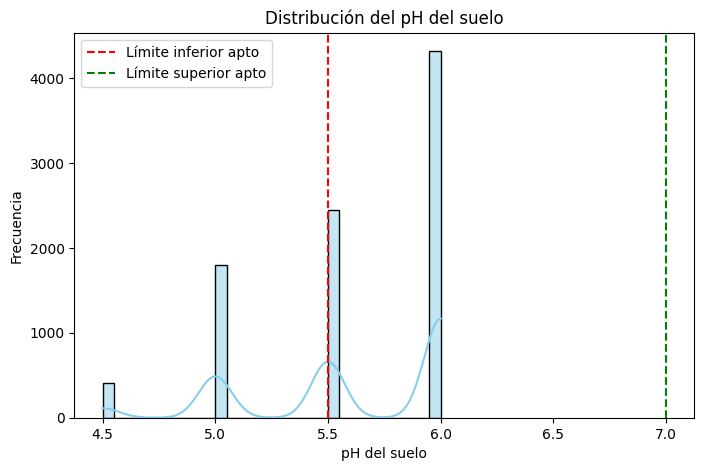

In [19]:
# Histograma con curva de densidad (KDE) usando seaborn y matplotlib
# Solo usamos los valores no nulos de pH_suelo
if "pH_suelo" in df.columns and df["pH_suelo"].notnull().sum() > 0:
    plt.figure(figsize=(8, 5))
    sns.histplot(df["pH_suelo"].dropna(), bins=30, kde=True, color="skyblue")
    plt.title("Distribución del pH del suelo")
    plt.xlabel("pH del suelo")
    plt.ylabel("Frecuencia")
    plt.axvline(5.5, color="red", linestyle="--", label="Límite inferior apto")
    plt.axvline(7.0, color="green", linestyle="--", label="Límite superior apto")
    plt.legend()
    plt.show()
else:
    print("⚠️ No hay datos de pH_suelo para graficar.")


📌 Qué es:

* Es un gráfico que muestra cómo se distribuyen los valores de pH del suelo en el conjunto de datos.

* El histograma (las barras) indica cuántas observaciones caen dentro de cada rango de pH.

* La curva (KDE) encima de las barras representa la forma estimada de la distribución.


📌 Elementos extra que incluye:

* Dos líneas verticales (axvline) que marcan los límites de pH considerados aptos para el cultivo:

* ***Línea roja en 5.5 → límite inferior.***

* ***Línea verde en 7.0 → límite superior.***



In [20]:
# Eliminar columnas innecesarias
columnas_quitar = [
    'Codigo', 'Nombre', 'Categoria', 'Tecnologia', 'Estado',
    'Ubicación', 'Entidad', 'geometry', 'Fecha_instalacion',
    'Corriente', 'Area Hidrografica', 'Zona Hidrografica', 'Subzona hidrografica'
]

df_limpio = df.drop(columns=columnas_quitar, errors='ignore')

# Eliminar filas donde falten datos clave
df_limpio = df_limpio.dropna(subset=['Altitud', 'Latitud', 'Longitud', 'pH_suelo'])

#  Reiniciar índices
df_limpio = df_limpio.reset_index(drop=True)

# Verificar los primeros datos
df_limpio.head()


,Departamento,Municipio,Altitud,Fecha_suspension,Area Operativa,Latitud,Longitud,pH_suelo,Papa_apto
0,Nariño,Ipiales,2582,NaN,Area Operativa 07 - Nariño-Putumayo,0.813786,-77.661978,5.0,1
1,Nariño,Contadero,2450,NaN,Area Operativa 07 - Nariño-Putumayo,0.930306,-77.491194,5.0,1
2,Nariño,Túquerres,3120,NaN,Area Operativa 07 - Nariño-Putumayo,1.070611,-77.636889,4.5,0
3,Putumayo,Mocoa,760,NaN,Area Operativa 07 - Nariño-Putumayo,1.082889,-76.667111,6.0,0
4,Amazonas,Puerto Nariño,158,NaN,Area Operativa 11 - Cundinamarca-Amazonas-San ...,-3.780306,-70.362639,6.0,0


In [21]:
# Características (variables independientes)
X = df_limpio[['Altitud', 'Latitud', 'Longitud', 'pH_suelo']]

# Etiqueta (variable objetivo)
y = df_limpio['Papa_apto']


In [22]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)



In [23]:
df_limpio.shape
df[['Altitud', 'Latitud', 'Longitud', 'pH_suelo', 'Papa_apto']].isna().sum()
# Solo eliminar si faltan datos clave para el modelo
df_limpio = df.dropna(subset=['Altitud', 'Latitud', 'Longitud', 'pH_suelo', 'Papa_apto']).copy()
print("Filas después de limpieza:", df_limpio.shape[0])


Filas después de limpieza: 8973


In [24]:
# Crear el modelo
modelo = DecisionTreeClassifier(max_depth=3, random_state=42)

# Entrenar el modelo
modelo.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=3, random_state=42)

In [25]:
# Predecir con los datos de prueba
y_pred = modelo.predict(X_test)

# Mostrar métricas
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))


[[1337    0]
 [   0  458]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1337
           1       1.00      1.00      1.00       458

    accuracy                           1.00      1795
   macro avg       1.00      1.00      1.00      1795
weighted avg       1.00      1.00      1.00      1795



In [26]:
print(df['Papa_apto'].value_counts())

Papa_apto
0    6806
1    2167
Name: count, dtype: int64


In [27]:
df[df['Papa_apto'] == 1]


,Codigo,Nombre,Categoria,Tecnologia,Estado,Departamento,Municipio,Ubicación,Altitud,Fecha_instalacion,...,Corriente,Area Hidrografica,Zona Hidrografica,Subzona hidrografica,Entidad,Latitud,Longitud,geometry,pH_suelo,Papa_apto
0,52057100,RUMICHACA - AUT [52057100],Limnigráfica,Automática con Telemetría,Activa,Nariño,Ipiales,"(0.81378611, -77.66197778)",2582,2016-11-15,...,Guaitara,Pacifico,Patía,Río Guáitara,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,0.813786,-77.661978,POINT (-77.66198 0.81379),5.0,1
1,52055170,LA JOSEFINA - AUT [52055170],Climática Principal,Automática con Telemetría,Activa,Nariño,Contadero,"(0.93030556, -77.49119444)",2450,2005-12-10,...,Guaitara,Pacifico,Patía,Río Guáitara,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,0.930306,-77.491194,POINT (-77.49119 0.93031),5.0,1
17,51020011,Piedrancha - - AUT [51020011],Pluviográfica,Automática con Telemetría,Activa,Nariño,Mallama (Piedrancha),"(1.14152778, -77.92897222)",1830,2016-07-01,...,Hacha,Pacifico,Mira,Río Mira,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,1.141528,-77.928972,POINT (-77.92897 1.14153),5.5,1
19,52055210,BOTANA - AUT [52055210],Climática Principal,Automática con Telemetría,Activa,Nariño,Pasto,"(1.16, -77.27880556)",2820,2004-03-01,...,Hacha,Pacifico,Patía,Río Juananbú,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,1.160000,-77.278806,POINT (-77.27881 1.16),5.0,1
23,26015010,EL TABLAZO - AUT [26015010],Climática Principal,Automática con Telemetría,Activa,Cauca,Popayán,"(2.47483306, -76.58129361)",1837,2005-06-28,...,Vaupes,Magdalena Cauca,Cauca,Alto Río Cauca,INSTITUTO DE HIDROLOGIA METEOROLOGIA Y ESTUDIO...,2.474833,-76.581294,POINT (-76.58129 2.47483),5.5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8952,2120000141,COLEGIO VEINTIUN ANGELES - AUT [2120000099],Pluviométrica,Automática con Telemetría,Activa,Bogotá,"Bogota, D.C","(4.75, -74.08)",2614,2018-06-19,...,0,Magdalena Cauca,Alto Magdalena,Río Bogotá,INSTITUTO DISTRITAL DE GESTIÓN DE RIESGOS Y CA...,4.750000,-74.080000,POINT (-74.08 4.75),5.0,1
8953,2120000144,COLEGIO ALEMANIA SOLIDARIA - AUT [2120000100],Pluviométrica,Automática con Telemetría,Activa,Bogotá,"Bogota, D.C","(4.65, -74.08)",2556,2018-06-19,...,0,Magdalena Cauca,Alto Magdalena,Río Bogotá,INSTITUTO DISTRITAL DE GESTIÓN DE RIESGOS Y CA...,4.650000,-74.080000,POINT (-74.08 4.65),5.0,1
8954,2120000145,ALTOS DE LA ESTANCIA - AUT [2120000101],Pluviométrica,Automática con Telemetría,Activa,Bogotá,"Bogota, D.C","(4.58, -74.18)",2736,2018-06-19,...,0,Magdalena Cauca,Alto Magdalena,Río Bogotá,INSTITUTO DISTRITAL DE GESTIÓN DE RIESGOS Y CA...,4.580000,-74.180000,POINT (-74.18 4.58),5.0,1
8955,2120000149,COLEGIO RODOLFO LLINAS - AUT [2120000109],Pluviométrica,Automática con Telemetría,Activa,Bogotá,"Bogota, D.C","(4.72, -74.11)",2554,2018-06-19,...,0,Magdalena Cauca,Alto Magdalena,Río Bogotá,INSTITUTO DISTRITAL DE GESTIÓN DE RIESGOS Y CA...,4.720000,-74.110000,POINT (-74.11 4.72),5.0,1


In [28]:
print(df['pH_suelo'].describe())
print(df['Altitud'].describe())
print(df['Papa_apto'].value_counts())

count    8973.000000
mean        5.594617
std         0.455458
min         4.500000
25%         5.500000
50%         5.500000
75%         6.000000
max         6.000000
Name: pH_suelo, dtype: float64
count    8973.000000
mean     1209.487797
std      1023.864901
min         0.000000
25%       190.000000
50%      1049.000000
75%      1960.000000
max      5072.000000
Name: Altitud, dtype: float64
Papa_apto
0    6806
1    2167
Name: count, dtype: int64


In [29]:
# Variables y etiquetas
X = df_limpio[['pH_suelo', 'Altitud', 'Latitud', 'Longitud']]
y = df_limpio['Papa_apto']

# Dividir datos
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Modelo
modelo_arbol = DecisionTreeClassifier(max_depth=4, random_state=42)
modelo_arbol.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=42)

In [30]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y)

In [31]:
y_test.value_counts()
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [32]:
print(y_train.value_counts())
print(y_test.value_counts())

Papa_apto
0    5444
1    1734
Name: count, dtype: int64
Papa_apto
0    1362
1     433
Name: count, dtype: int64


In [33]:

joblib.dump(modelo_arbol, 'modelo_arbol_papa.pkl')


['modelo_arbol_papa.pkl']

In [34]:
modelo = joblib.load('modelo_arbol_papa.pkl')

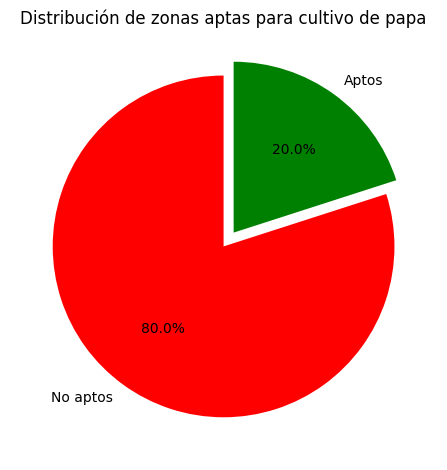

In [35]:
# Diagrama de tortas
df['aptitud'] = ((df['Altitud'].between(2000, 3500)) &
                 (df['pH_suelo'].between(5.0, 7.5))).astype(int)


aptitud_counts = df['aptitud'].value_counts()


labels = ["No aptos", "Aptos"]
colors = ["red", "green"]

explode = [0] * len(aptitud_counts)
if len(aptitud_counts) == 2:
    explode[1] = 0.1


plt.figure()
plt.pie(
    aptitud_counts,
    labels=[labels[i] for i in aptitud_counts.index],
    autopct="%.1f%%",
    startangle=90,
    colors=[colors[i] for i in aptitud_counts.index],
    explode=explode if len(aptitud_counts) > 1 else None
)
plt.title("Distribución de zonas aptas para cultivo de papa")
plt.ylabel("")
plt.tight_layout()
plt.show()

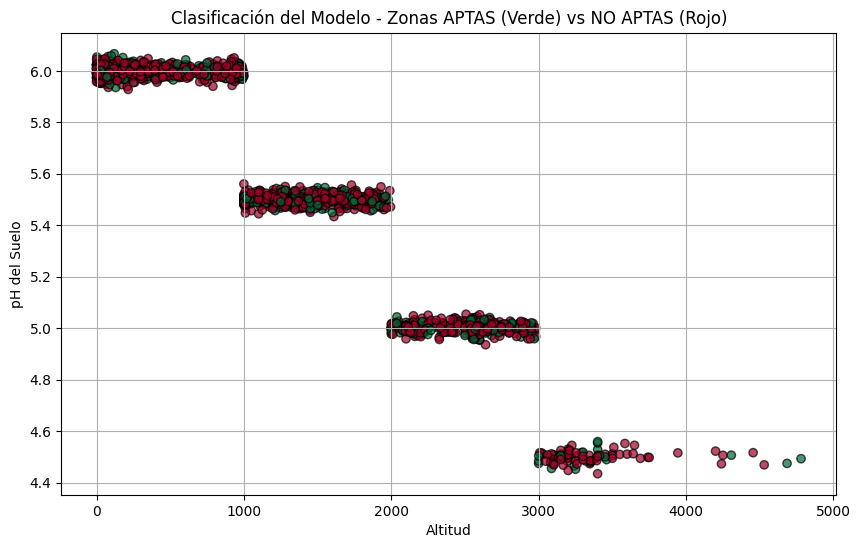

In [36]:
plt.figure(figsize=(10, 6))

# Le metemos un poco de "jitter" al eje Y para separar los puntos
import numpy as np
ph_con_jitter = X_test['pH_suelo'] + np.random.normal(0, 0.02, size=X_test.shape[0])


plt.scatter(X_test['Altitud'], ph_con_jitter, c=y_pred, cmap='RdYlGn', alpha=0.7, edgecolors='k')
plt.xlabel('Altitud')
plt.ylabel('pH del Suelo')
plt.title('Clasificación del Modelo - Zonas APTAS (Verde) vs NO APTAS (Rojo)')
plt.grid(True)
plt.show()

/usr/local/lib/python3.11/dist-packages/pandas/plotting/_matplotlib/core.py:975: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "-o" (-> marker='o'). The keyword argument will take precedence.
  return ax.plot(*args, **kwds)


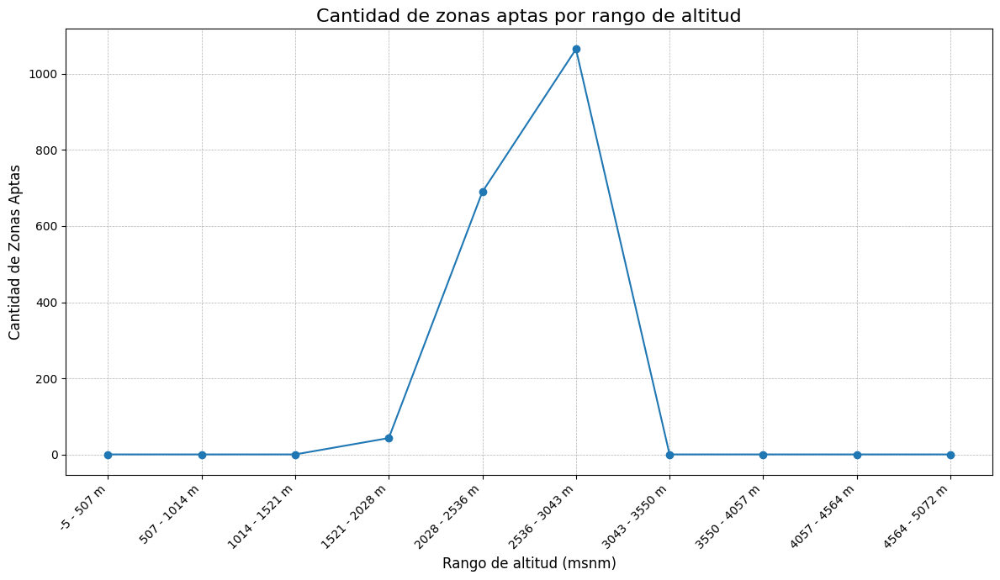

In [37]:
# Crear los rangos de altitud
df['Altitud_bin'] = pd.cut(df['Altitud'], bins=10)

# Agrupar por rango y sumar las zonas aptas
altitud_group = df.groupby('Altitud_bin', observed=True)['aptitud'].sum()


# Tomamos el inicio y fin de cada rango y lo convertimos a entero
labels = [f"{int(interval.left)} - {int(interval.right)} m" for interval in altitud_group.index]

plt.figure(figsize=(12, 7))
altitud_group.plot(kind='line', marker='o', style='-o')

# Títulos y etiquetas
plt.title("Cantidad de zonas aptas por rango de altitud", fontsize=16)
plt.xlabel("Rango de altitud (msnm)", fontsize=12)
plt.ylabel("Cantidad de Zonas Aptas", fontsize=12)


plt.xticks(ticks=range(len(labels)), labels=labels, rotation=45, ha="right")


plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

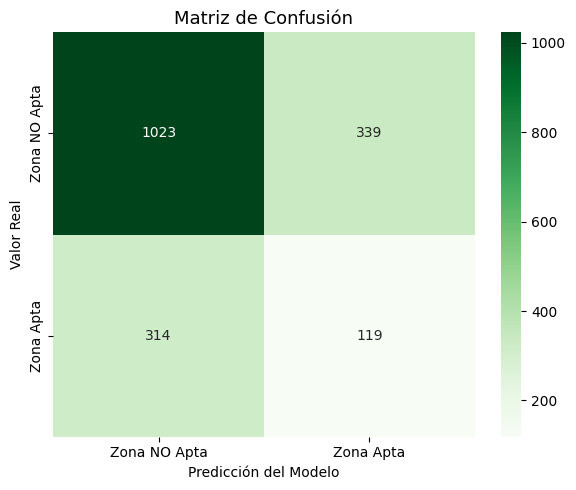

In [38]:
etiquetas = ["Zona NO Apta", "Zona Apta"]


matriz = confusion_matrix(y_test, y_pred)


plt.figure(figsize=(6, 5))
sns.heatmap(
    matriz,
    annot=True,
    fmt='d',
    cmap='Greens',
    xticklabels=etiquetas,
    yticklabels=etiquetas
)
plt.title("Matriz de Confusión", fontsize=13)
plt.xlabel("Predicción del Modelo")
plt.ylabel("Valor Real")
plt.tight_layout()
plt.show()

In [39]:
reporte = classification_report(y_test, y_pred, output_dict=True)
pd.DataFrame(reporte).transpose().to_csv("reporte_metricas.csv")

*  classification_report(y_test, y_pred, output_dict=True) :  Genera el reporte de
clasificación de scikit-learn (precisión, recall, f1-score, soporte).



Como se pone output_dict=True, en vez de devolverlo como texto bonito, lo devuelve como un diccionario de Python, donde cada clave es una clase o una métrica.

*  pd.DataFrame(reporte) : Convierte ese diccionario en un DataFrame de pandas, para que sea más fácil manipularlo como tabla.

*  .transpose()   :  Cambia filas por columnas (porque el reporte viene con las métricas como llaves y no queda bien en filas).

*  .to_csv("reporte_metricas.csv") : Guarda ese DataFrame como un archivo CSV llamado reporte_metricas.csv, que puedes abrir en Excel o cualquier editor de texto.

***En resumen: genera un reporte de métricas del modelo y lo guarda en un archivo para analizarlo después.***

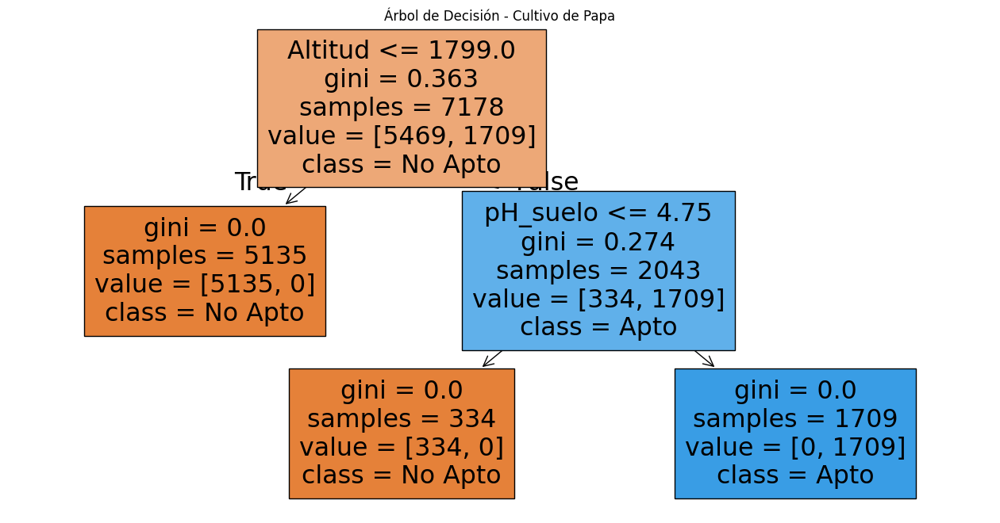

In [40]:
# Creamos un arbol de decision para usarlo en la prediccion
plt.figure(figsize=(16,8))
plot_tree(modelo_arbol, feature_names=X.columns, class_names=['No Apto', 'Apto'], filled=True)
plt.title("Árbol de Decisión - Cultivo de Papa")
plt.show()

In [41]:
df_limpio['Papa_apto'].value_counts()

,count
Papa_apto,
0,6806
1,2167


In [42]:
df['Papa_apto'] = (df['Altitud'] >= 2500).astype(int)

In [43]:
print(df['Altitud'].min(), df['Altitud'].max())


0 5072


In [44]:
df['Papa_apto'] = (df['Altitud'] >= 2000).astype(int)


In [45]:
conteo = df['Papa_apto'].value_counts(normalize=True) * 100
print(conteo)


Papa_apto
0    75.370556
1    24.629444
Name: proportion, dtype: float64


In [46]:
joblib.dump(modelo, 'modelo_decision_papa.pkl')

['modelo_decision_papa.pkl']

In [47]:
# Creamos la base del mapa
m = folium.Map(location=[4.5709, -74.2973], zoom_start=6) # Le ponemos las coordenadas del centro de colombia para que se enfoque ahí


cluster = MarkerCluster().add_to(m)


if 'df_limpio' in globals() and not df_limpio.empty:
    for idx, row in df_limpio.iterrows():
        if pd.notna(row['Latitud']) and pd.notna(row['Longitud']) and 'Papa_apto' in row and 'Municipio' in row and 'Altitud' in row:
            papa_apto_status = int(row['Papa_apto']) if pd.notna(row['Papa_apto']) else 0
            color = 'green' if papa_apto_status == 1 else 'red'
            folium.CircleMarker(
                location=[row['Latitud'], row['Longitud']],
                radius=4,
                color=color,
                fill=True,
                fill_opacity=0.7,
                popup=f"{row['Municipio']} ({row['Altitud']} msnm) - Apto: {'Sí' if papa_apto_status == 1 else 'No'}"
            ).add_to(cluster)
        else:
            pass
else:
    print("⚠️ DataFrame df_limpio no encontrado o está vacío. No se añadirán marcadores al mapa.")


# Mostrar el mapa
display(m)

Mapa interactivo de distribución geográfica de municipios
Este mapa muestra la ubicación de diferentes municipios utilizando sus coordenadas (latitud y longitud).
Los puntos están agrupados por proximidad usando un sistema de clusters,
lo que facilita ver regiones con alta densidad de datos.

**Cada marcador individual está coloreado:**

***Verde***→ Municipio apto para el cultivo de papa

***Rojo*** → Municipio no apto

Al hacer clic en un marcador, aparece información adicional como el nombre del municipio, su altitud (msnm) y si es apto o no para el cultivo.


In [48]:
print(df_limpio[['Latitud','Longitud']].head(10))
print(df_limpio[['Latitud','Longitud']].isna().sum())
print(len(df_limpio))

    Latitud   Longitud
0  0.813786 -77.661978
1  0.930306 -77.491194
2  1.070611 -77.636889
3  1.082889 -76.667111
4 -3.780306 -70.362639
5 -1.351667 -70.803750
6 -0.074167 -72.451389
7  0.843111 -77.388806
8  1.725250 -75.666389
9  1.741111 -77.531111
Latitud     0
Longitud    0
dtype: int64
8973


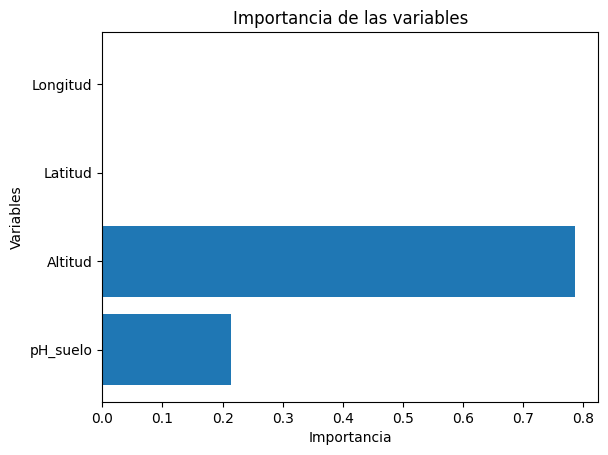

In [49]:
importancias = modelo.feature_importances_
columnas = X.columns

plt.barh(columnas, importancias)
plt.title("Importancia de las variables")
plt.xlabel("Importancia")
plt.ylabel("Variables")
plt.show()

,count,mean,std,min,25%,50%,75%,max
Altitud,8973.0,1209.487797,1023.864901,0.000000,190.000000,1049.000000,1960.0000,5072.000000
pH_suelo,8973.0,5.594617,0.455458,4.500000,5.500000,5.500000,6.0000,6.000000
Latitud,8973.0,5.663869,2.505053,-4.283333,4.245400,5.177083,6.9975,15.797500
Longitud,8973.0,-74.761452,1.518254,-83.056194,-75.766667,-74.940833,-73.7700,-66.833333


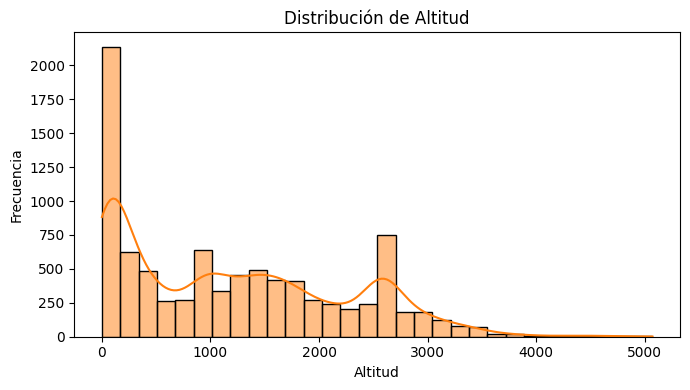

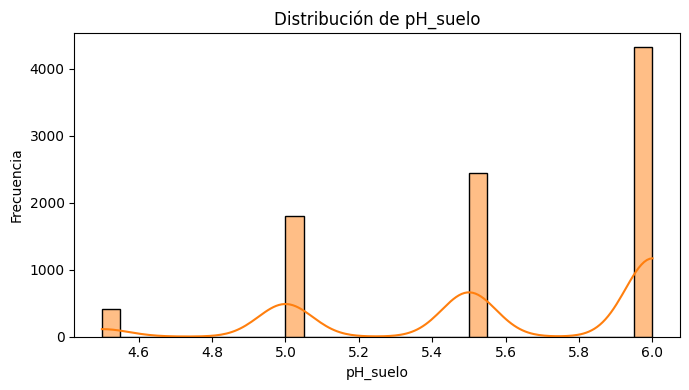

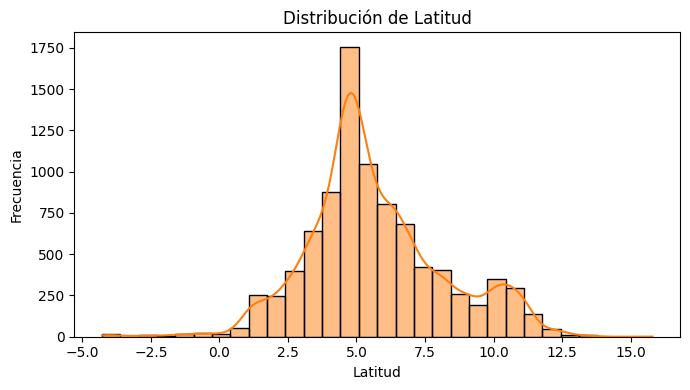

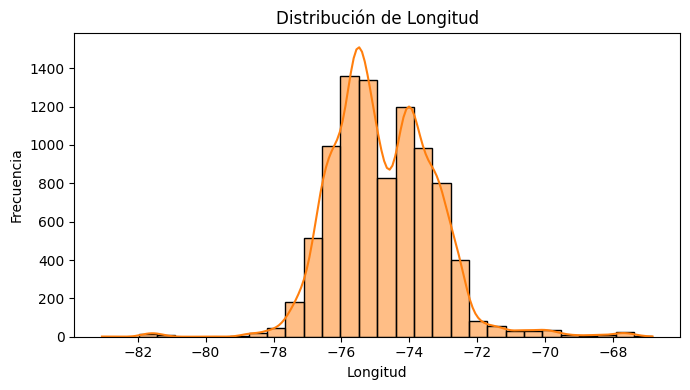

In [50]:
# COLUMNAS NUMÉRICAS QUE NOS INTERESAN
# Ajusta esta lista según las columnas de tu df
numeric_cols = ['Altitud','pH_suelo','Latitud','Longitud']
# Si tienes más variables (temperatura, precipitación...) agrégalas aquí.

# Estadísticos descriptivos generales
display(df[numeric_cols].describe().T)

# Guardar estadísticos en CSV (opcional)
df[numeric_cols].describe().T.to_csv('/content/estadisticas_univariado.csv')

# Histogramas + KDE para cada variable
for col in numeric_cols:
    plt.figure(figsize=(7,4))
    sns.histplot(df[col].dropna(), kde=True, bins=30, color='tab:orange')
    plt.title(f'Distribución de {col}')
    plt.xlabel(col)
    plt.ylabel('Frecuencia')
    plt.tight_layout()
    plt.show()


/tmp/ipython-input-4223943364.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Papa_apto', y='Altitud', data=df, palette=['red','green'])
/tmp/ipython-input-4223943364.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Papa_apto', y='pH_suelo', data=df, palette=['red','green'])


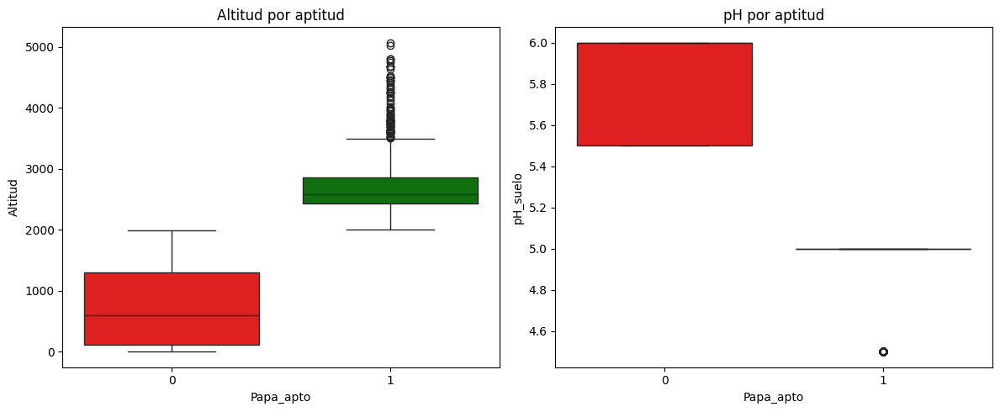

Altitud                            pH_suelo                   \
                  mean  median         std count      mean median       std   
Papa_apto                                                                     
0           731.846074   600.0  632.663183  6763  5.819385    6.0  0.240196   
1          2671.157919  2590.0  443.362440  2210  4.906787    5.0  0.194769   

                 
          count  
Papa_apto        
0          6763  
1          2210

In [56]:
output_dir = '/content/data'
os.makedirs(output_dir, exist_ok=True)


if 'Papa_apto' not in df.columns:
    raise ValueError("No existe la columna 'Papa_apto'")

# Boxplots: comparar Altitud y pH entre aptos/no aptos
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.boxplot(x='Papa_apto', y='Altitud', data=df, palette=['red','green'])
plt.title('Altitud por aptitud')
plt.subplot(1,2,2)
sns.boxplot(x='Papa_apto', y='pH_suelo', data=df, palette=['red','green'])
plt.title('pH por aptitud')
plt.tight_layout()
plt.show()

# Medias por grupo
group_stats = df.groupby('Papa_apto')[['Altitud','pH_suelo']].agg(['mean','median','std','count'])
display(group_stats)
group_stats.to_csv(f'{output_dir}/estadisticas_bivariado_por_grupo.csv')

RandomForest - Classification report
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1353
           1       1.00      1.00      1.00       442

    accuracy                           1.00      1795
   macro avg       1.00      1.00      1.00      1795
weighted avg       1.00      1.00      1.00      1795

Confusion matrix (RF):


array([[1353,    0],
       [   0,  442]])

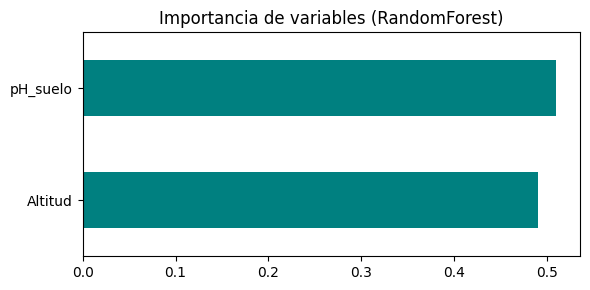

RandomForest 5-fold CV accuracy: [1. 1. 1. 1. 1.] mean: 1.0


['/content/modelo_rf_altitud_ph.pkl']

In [52]:
X_simple = df[['Altitud','pH_suelo']].dropna()
y_simple = df.loc[X_simple.index, 'Papa_apto'].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X_simple, y_simple, test_size=0.2, random_state=42, stratify=y_simple)

# Crear random Forest
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

print("RandomForest - Classification report")
print(classification_report(y_test, y_pred_rf))
print("Confusion matrix (RF):")
display(confusion_matrix(y_test, y_pred_rf))

# Importancia de variables
feat_imp = pd.Series(rf.feature_importances_, index=X_simple.columns).sort_values(ascending=True)
plt.figure(figsize=(6,3))
feat_imp.plot(kind='barh', color='teal')
plt.title('Importancia de variables (RandomForest)')
plt.tight_layout()
plt.show()

# Validación cruzada (accuracy)
cv_scores = cross_val_score(rf, X_simple, y_simple, cv=5, scoring='accuracy')
print("RandomForest 5-fold CV accuracy:", cv_scores.round(3), "mean:", cv_scores.mean().round(3))

# Guardar modelo RF (solo si querés usarlo luego)
joblib.dump(rf, '/content/modelo_rf_altitud_ph.pkl')

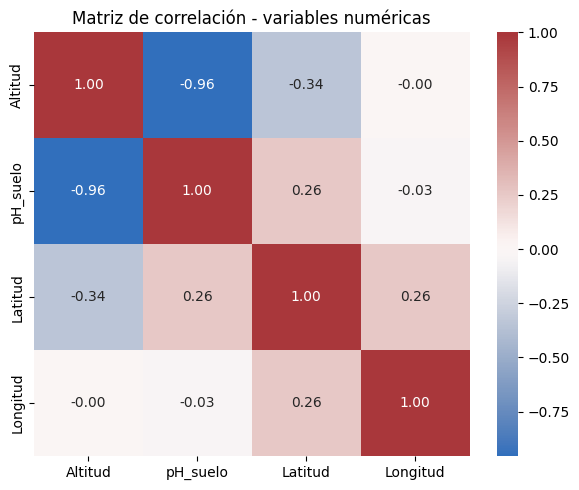

In [53]:
corr = df[numeric_cols].corr()
plt.figure(figsize=(6,5))
sns.heatmap(corr, annot=True, fmt=".2f", cmap='vlag', center=0)
plt.title('Matriz de correlación - variables numéricas')
plt.tight_layout()
plt.show()

# Guardar matriz de correlación
corr.to_csv('/content/data/matriz_correlacion.csv')


In [57]:
scores = cross_val_score(modelo, X, y, cv=5)
print("Accuracy promedio:", scores.mean())

Accuracy promedio: 1.0


In [58]:
modelo = joblib.load("modelo_arbol_papa.pkl")

In [59]:
X = df_limpio[["Altitud", "pH_suelo"]]
y = df_limpio["Papa_apto"]
modelo = DecisionTreeClassifier()
modelo.fit(X, y)

DecisionTreeClassifier()

In [60]:
Altitud = 2500
pH_suelo = 5.2

entrada = pd.DataFrame([[Altitud, pH_suelo]], columns=["Altitud", "pH_suelo"])
pred = modelo.predict(entrada)
print(pred)

[1]


In [61]:
if hasattr(modelo, 'feature_names_in_'):
    print("✅ Columnas esperadas por el modelo:")
    print(modelo.feature_names_in_)
else:
    print("⚠️ El modelo no tiene atributo `feature_names_in_`")

✅ Columnas esperadas por el modelo:
['Altitud' 'pH_suelo']


In [62]:
altitud = 2500
ph = 5.5

In [63]:
# Clasificar si es apto para la papa
def clasificar_apto_papa(row):
    if 2000 <= row['Altitud'] <= 3200 and 5.0 <= row['pH_suelo'] <= 7.0:
        return 1
    return 0


if 'pH_suelo' in df_limpio.columns:
    df_limpio['Papa_apto'] = df_limpio.apply(clasificar_apto_papa, axis=1)

    # Filtramos para mostrar solo los lugares aptos
    df_aptos = df_limpio[df_limpio['Papa_apto'] == 1]

    print("✅ Lugares aptos para cultivo de papa encontrados:")
    if not df_aptos.empty:
        print(df_aptos[['Municipio', 'Altitud', 'pH_suelo']].to_markdown(index=False, numalign="left", stralign="left"))
    else:
        print("No se encontraron lugares que cumplan con los criterios.")
else:
    print("⚠️ No se encontró la columna 'pH_suelo'. Verifica que ya hayas cargado esos datos.")

✅ Lugares aptos para cultivo de papa encontrados:
| Municipio                   | Altitud   | pH_suelo   |
|:----------------------------|:----------|:-----------|
| Ipiales                     | 2582      | 5          |
| Contadero                   | 2450      | 5          |
| Pasto                       | 2820      | 5          |
| Pasto                       | 2626      | 5          |
| Neiva                       | 2101      | 5          |
| Cabrera (Cundinamarca)      | 2957      | 5          |
| Cajamarca                   | 2530      | 5          |
| San Cayetano (Cundinamarca) | 2807      | 5          |
| Pasca                       | 2256      | 5          |
| Mosquera (Cundinamarca)     | 2543      | 5          |
| Calarcá                     | 2255      | 5          |
| Bogota, D.C                 | 2687      | 5          |
| Bogota, D.C                 | 2646      | 5          |
| Bogota, D.C                 | 2556      | 5          |
| Suesca                      | 2618  

In [64]:
# Cargar el modelo entrenado
modelo = joblib.load("modelo_arbol_papa.pkl")

# Mostrar columnas que espera el modelo y rangos esperados
print("-" * 50)
print("🔎 Columnas esperadas:", modelo.feature_names_in_)
print("-" * 50)
print("🌿 Evaluador de aptitud para cultivo de papa 🌿")
print("-" * 50)
print("📌 Rango ideal:")
print("-" * 50)
print("  🟢 Altitud: 2000 - 3000 msnm")
print("-" * 50)
print("  🟢 pH: 4.5 - 6.0\n")
print("=" * 50)

# Captura y define valores
try:
    altitud = float(input("🧭 Ingrese la altitud en metros sobre el nivel del mar (msnm): "))
    print("-" * 50)
    ph = float(input("🧪Ingrese el pH del suelo: "))
    print("-" * 50)
except ValueError:
    print("❌ Por favor ingrese valores numéricos válidos.")
    print("-" * 50)
else:

    entrada = pd.DataFrame([[ph, altitud, 0, 0]], columns=["pH_suelo", "Altitud", "Latitud", "Longitud"])

    # Predicción
    pred = modelo.predict(entrada)[0]
    # Redaultado
    if pred == 1:
       print(Fore.GREEN + "✅ La zona ES APTA para cultivo de papa 🥔" + Style.RESET_ALL)
    else:
       print(Fore.RED + "❌ La zona NO es apta para cultivo de papa 🚫" + Style.RESET_ALL)

--------------------------------------------------
🔎 Columnas esperadas: ['pH_suelo' 'Altitud' 'Latitud' 'Longitud']
--------------------------------------------------
🌿 Evaluador de aptitud para cultivo de papa 🌿
--------------------------------------------------
📌 Rango ideal:
--------------------------------------------------
  🟢 Altitud: 2000 - 3000 msnm
--------------------------------------------------
  🟢 pH: 4.5 - 6.0

🧭 Ingrese la altitud en metros sobre el nivel del mar (msnm): 2500
--------------------------------------------------
🧪Ingrese el pH del suelo: 6.0
--------------------------------------------------
✅ La zona ES APTA para cultivo de papa 🥔


In [65]:
# Cargar modelo
modelo = joblib.load("modelo_arbol_papa.pkl")

# Función de predicción
def evaluar_aptitud(altitud, ph):
    entrada = pd.DataFrame([[ph, altitud, 0, 0]], columns=["pH_suelo", "Altitud", "Latitud", "Longitud"])
    pred = modelo.predict(entrada)[0]
    return "✅ Apta para papa 🥔" if pred == 1 else "❌ No apta para papa 🚫"

# Interfaz Gradio
demo = gr.Interface(
    fn=evaluar_aptitud,
    inputs=[
        gr.Number(label="Altitud (msnm)", value=2500),
        gr.Number(label="pH del suelo", value=5.5)
    ],
    outputs=gr.Textbox(label="Resultado"),
    title="🌾 Evaluador de zonas aptas para cultivo de papa",
    description="Ingrese altitud y pH del suelo para determinar si es apta para cultivo de papa."
)

demo.launch()

It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://89a0c162733ae0b291.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [66]:
print("Rango de altitud:", df_limpio['Altitud'].min(), "-", df_limpio['Altitud'].max())
print("Rango de pH del suelo:", df_limpio['pH_suelo'].min(), "-", df_limpio['pH_suelo'].max())

Rango de altitud: 0 - 5072
Rango de pH del suelo: 4.5 - 6.0


In [67]:
df['aptitud'] = ((df_limpio['Altitud'].between(2000, 3500)) &
                 (df_limpio['pH_suelo'].between(5.0, 7.5))).astype(int)

In [68]:
# Si tu modelo de árbol existe:
if 'modelo_arbol' in globals():
    # Use the X_test that was split from the full dataset
    X_full = df_limpio[['pH_suelo', 'Altitud', 'Latitud', 'Longitud']]
    y_full = df_limpio['Papa_apto']
    X_train_full, X_test_full, y_train_full, y_test_full = train_test_split(X_full, y_full, test_size=0.2, random_state=42, stratify=y_full)

    y_pred_tree = modelo_arbol.predict(X_test_full)
    print("Decision Tree - report")
    print(classification_report(y_test_full, y_pred_tree))
    display(confusion_matrix(y_test_full, y_pred_tree))
else:
    print("No se encontró 'modelo_arbol' en el workspace. Salta este bloque o carga el modelo.")

Decision Tree - report
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      1435
           1       0.82      1.00      0.90       360

    accuracy                           0.96      1795
   macro avg       0.91      0.97      0.94      1795
weighted avg       0.96      0.96      0.96      1795



array([[1355,   80],
       [   0,  360]])

In [69]:
df.info()
df.describe()
df.duplicated().sum()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8973 entries, 0 to 8972
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Codigo                8973 non-null   int64   
 1   Nombre                8973 non-null   object  
 2   Categoria             8973 non-null   object  
 3   Tecnologia            8973 non-null   object  
 4   Estado                8973 non-null   object  
 5   Departamento          8973 non-null   object  
 6   Municipio             8973 non-null   object  
 7   Ubicación             8973 non-null   object  
 8   Altitud               8973 non-null   int64   
 9   Fecha_instalacion     8839 non-null   object  
 10  Fecha_suspension      3441 non-null   object  
 11  Area Operativa        8973 non-null   object  
 12  Corriente             8955 non-null   object  
 13  Area Hidrografica     8973 non-null   object  
 14  Zona Hidrografica     8973 non-null   object  
 

np.int64(0)

In [70]:
# Para ver las zonas optimas y las no optimas
zonas_optimas = df[df["aptitud"] == 1]
zonas_no_optimas = df[df["aptitud"] == 0]

# Imprimir un resumen
print("🔍 Total zonas óptimas:", len(zonas_optimas))
print("🔍 Total zonas NO óptimas:", len(zonas_no_optimas))

🔍 Total zonas óptimas: 1798
🔍 Total zonas NO óptimas: 7175
